<h1>Data Analytics Project</h1>

<h1>United Kingdom Road Accident Data Analysis</h1>
<h3>Inclusive Years : 2019-2020</h3>
<h5>Analyst: Cristina Gail Rodelas</h5>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
#import seaborn as sns
from scipy.stats import f_oneway
warnings.filterwarnings('ignore')

In [2]:
accident = pd.read_csv('datasets\\accident data.csv')

In [3]:
accident

,Index,Accident_Severity,Accident Date,Latitude,Light_Conditions,District Area,Longitude,Number_of_Casualties,Number_of_Vehicles,Road_Surface_Conditions,Road_Type,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
0,200701BS64157,Serious,05/06/2019,51.506187,Darkness - lights lit,Kensington and Chelsea,-0.209082,1,2,Dry,Single carriageway,Urban,Fine no high winds,Car
1,200701BS65737,Serious,02/07/2019,51.495029,Daylight,Kensington and Chelsea,-0.173647,1,2,Wet or damp,Single carriageway,Urban,Raining no high winds,Car
2,200701BS66127,Serious,26/08/2019,51.517715,Darkness - lighting unknown,Kensington and Chelsea,-0.210215,1,3,Dry,NaN,Urban,NaN,Taxi/Private hire car
3,200701BS66128,Serious,16/08/2019,51.495478,Daylight,Kensington and Chelsea,-0.202731,1,4,Dry,Single carriageway,Urban,Fine no high winds,Bus or coach (17 or more pass seats)
4,200701BS66837,Slight,03/09/2019,51.488576,Darkness - lights lit,Kensington and Chelsea,-0.192487,1,2,Dry,NaN,Urban,NaN,Other vehicle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
660674,201091NM01760,Slight,18/02/2022,57.374005,Daylight,Highland,-3.467828,2,1,Dry,Single carriageway,Rural,Fine no high winds,Car
660675,201091NM01881,Slight,21/02/2022,57.232273,Darkness - no lighting,Highland,-3.809281,1,1,Frost or ice,Single carriageway,Rural,Fine no high winds,Car
660676,201091NM01935,Slight,23/02/2022,57.585044,Daylight,Highland,-3.862727,1,3,Frost or ice,Single carriageway,Rural,Fine no high winds,Car
660677,201091NM01964,Serious,23/02/2022,57.214898,Darkness - no lighting,Highland,-3.823997,1,2,Wet or damp,Single carriageway,Rural,Fine no high winds,Motorcycle over 500cc


<h1>Data Preparation</h1>

In [4]:
accident.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 660679 entries, 0 to 660678
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Index                    660679 non-null  object 
 1   Accident_Severity        660679 non-null  object 
 2   Accident Date            660679 non-null  object 
 3   Latitude                 660654 non-null  float64
 4   Light_Conditions         660679 non-null  object 
 5   District Area            660679 non-null  object 
 6   Longitude                660653 non-null  float64
 7   Number_of_Casualties     660679 non-null  int64  
 8   Number_of_Vehicles       660679 non-null  int64  
 9   Road_Surface_Conditions  659953 non-null  object 
 10  Road_Type                656159 non-null  object 
 11  Urban_or_Rural_Area      660664 non-null  object 
 12  Weather_Conditions       646551 non-null  object 
 13  Vehicle_Type             660679 non-null  object 
dtypes: f

In [5]:
accident.dtypes

Index                       object
Accident_Severity           object
Accident Date               object
Latitude                   float64
Light_Conditions            object
District Area               object
Longitude                  float64
Number_of_Casualties         int64
Number_of_Vehicles           int64
Road_Surface_Conditions     object
Road_Type                   object
Urban_or_Rural_Area         object
Weather_Conditions          object
Vehicle_Type                object
dtype: object

In [6]:
accident.describe()

,Latitude,Longitude,Number_of_Casualties,Number_of_Vehicles
count,660654.000000,660653.000000,660679.000000,660679.000000
mean,52.553866,-1.431210,1.357040,1.831255
std,1.406922,1.383330,0.824847,0.715269
min,49.914430,-7.516225,1.000000,1.000000
25%,51.490690,-2.332291,1.000000,1.000000
50%,52.315641,-1.411667,1.000000,2.000000
75%,53.453452,-0.232869,1.000000,2.000000
max,60.757544,1.762010,68.000000,32.000000


In [7]:
accident['Accident_Severity'] = accident['Accident_Severity'].astype('category')

In [8]:
accident['Accident_Severity'].value_counts()

Accident_Severity
Slight     563801
Serious     88217
Fatal        8661
Name: count, dtype: int64

In [9]:
accident.dtypes

Index                        object
Accident_Severity          category
Accident Date                object
Latitude                    float64
Light_Conditions             object
District Area                object
Longitude                   float64
Number_of_Casualties          int64
Number_of_Vehicles            int64
Road_Surface_Conditions      object
Road_Type                    object
Urban_or_Rural_Area          object
Weather_Conditions           object
Vehicle_Type                 object
dtype: object

<h1>Data Cleansing</h1>
<h3>Filling out null values</h3>

In [10]:
accident.isnull().sum()

Index                          0
Accident_Severity              0
Accident Date                  0
Latitude                      25
Light_Conditions               0
District Area                  0
Longitude                     26
Number_of_Casualties           0
Number_of_Vehicles             0
Road_Surface_Conditions      726
Road_Type                   4520
Urban_or_Rural_Area           15
Weather_Conditions         14128
Vehicle_Type                   0
dtype: int64

In [11]:
accident['Latitude'] = accident['Latitude'].fillna(accident['Latitude'].mode()[0])
accident['Longitude'] = accident['Longitude'].fillna(accident['Longitude'].mode()[0])  # Corrected here
accident['Road_Surface_Conditions'] = accident['Road_Surface_Conditions'].fillna('unknown surface condition')
accident['Road_Type'] = accident['Road_Type'].fillna('unaccounted')
accident['Weather_Conditions'] = accident['Weather_Conditions'].fillna('unaccounted')
accident['Urban_or_Rural_Area'] = accident['Urban_or_Rural_Area'].fillna(accident['Urban_or_Rural_Area'].mode()[0])

In [12]:
accident.isnull().sum()

Index                      0
Accident_Severity          0
Accident Date              0
Latitude                   0
Light_Conditions           0
District Area              0
Longitude                  0
Number_of_Casualties       0
Number_of_Vehicles         0
Road_Surface_Conditions    0
Road_Type                  0
Urban_or_Rural_Area        0
Weather_Conditions         0
Vehicle_Type               0
dtype: int64

<h1>Categorical Data Fields</h1>

In [13]:
accident['Accident_Severity'] = accident['Accident_Severity'].astype('category')
accident['Latitude'] = accident['Latitude'].astype('category')
accident['Light_Conditions'] = accident['Light_Conditions'].astype('category')
accident['District Area'] = accident['District Area'].astype('category')
accident['Longitude'] = accident['Longitude'].astype('category')
#accident['Number_of_Casualties'] = accident['Number_of_Casualties'].astype('int')
#accident['Number_of_Vehicles'] = accident['Number_of_Vehicles'].astype('int')
accident['Road_Surface_Conditions'] = accident['Road_Surface_Conditions'].astype('category')
accident['Road_Type'] = accident['Road_Type'].astype('category')
accident['Urban_or_Rural_Area'] = accident['Urban_or_Rural_Area'].astype('category')
accident['Weather_Conditions'] = accident['Weather_Conditions'].astype('category')
accident['Vehicle_Type'] = accident['Vehicle_Type'].astype('category')

In [14]:
accident.dtypes

Index                        object
Accident_Severity          category
Accident Date                object
Latitude                   category
Light_Conditions           category
District Area              category
Longitude                  category
Number_of_Casualties          int64
Number_of_Vehicles            int64
Road_Surface_Conditions    category
Road_Type                  category
Urban_or_Rural_Area        category
Weather_Conditions         category
Vehicle_Type               category
dtype: object

<h1>Converting object to DateTime Data Type</h1>

In [15]:
accident['Accident Date'] = accident['Accident Date'].astype('str')
#remove any space
accident['Accident Date'] = accident['Accident Date'].str.strip()
#convert everything from / (slash) to - (dash)
accident['Accident Date'] = accident['Accident Date'].str.replace('/', '-')

In [16]:
accident['Accident Date'] = pd.to_datetime(accident['Accident Date'], dayfirst = True, errors = 'coerce')

<h1>Adjusting Data Types</h1>

In [17]:
#accident['Accident Date']
accident.dtypes

Index                              object
Accident_Severity                category
Accident Date              datetime64[ns]
Latitude                         category
Light_Conditions                 category
District Area                    category
Longitude                        category
Number_of_Casualties                int64
Number_of_Vehicles                  int64
Road_Surface_Conditions          category
Road_Type                        category
Urban_or_Rural_Area              category
Weather_Conditions               category
Vehicle_Type                     category
dtype: object

<h1>Extracting date information using pandas date time</h1>

In [18]:
accident['Year'] = accident['Accident Date'].dt.year
accident['Month'] = accident['Accident Date'].dt.month
accident['Day'] = accident['Accident Date'].dt.day
accident['DayofWeek'] = accident['Accident Date'].dt.dayofweek #Monday=0, Sunday=6

In [19]:
accident.isnull().sum()

Index                      0
Accident_Severity          0
Accident Date              0
Latitude                   0
Light_Conditions           0
District Area              0
Longitude                  0
Number_of_Casualties       0
Number_of_Vehicles         0
Road_Surface_Conditions    0
Road_Type                  0
Urban_or_Rural_Area        0
Weather_Conditions         0
Vehicle_Type               0
Year                       0
Month                      0
Day                        0
DayofWeek                  0
dtype: int64

<h1>Data Analytics</h1>
<h3>Analyzing Each from the Data set</h3>

<h1>UniVariate</h1>

In [20]:
df_2019 = accident[accident['Year'] == 2019]

<h1>Univariate Analysis from Year 2019</h1>
<h1>Question No.1: How many incidents happened under light conditions?</h1>

In [21]:
print(f"total number of accident in 2019 is {df_2019['Light_Conditions'].value_counts().sum()}")
df_2019['Light_Conditions'].value_counts()

total number of accident in 2019 is 182115


Light_Conditions
Daylight                       133042
Darkness - lights lit           35769
Darkness - no lighting          10842
Darkness - lighting unknown      1768
Darkness - lights unlit           694
Name: count, dtype: int64

<h3>Insight No.1</h3>
<h4>Contrary to popular belief the most accident happens in darkness or at night time, majority of the accident happens on broad daylight. About 73.05% of the total accident in 2019 happened during Daylight.</h4>

<h1>No.1 Visualization</h1>

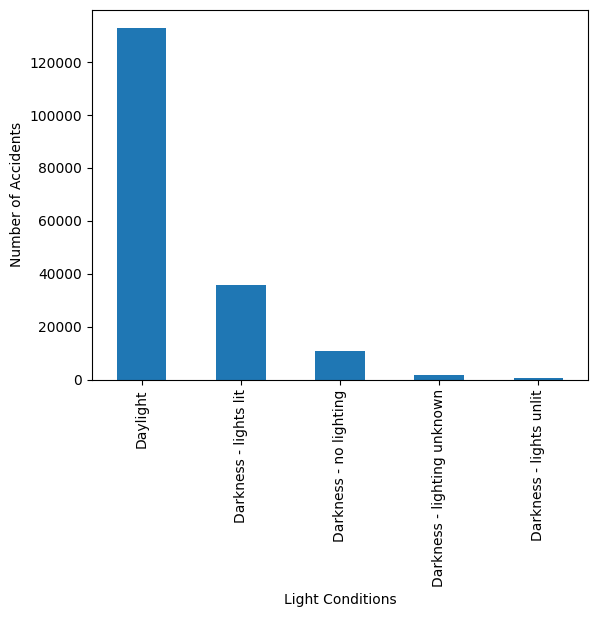

In [22]:
light_conditions_count = df_2019['Light_Conditions'].value_counts()
light_conditions_count.plot(kind='bar')
plt.xlabel('Light Conditions')
plt.ylabel('Number of Accidents')
plt.show()

<h1>Question No.2: What is the total number of accidents in 2019 and 2020?</h1>

In [23]:
total_accidents_2019 = accident[accident['Accident Date'].dt.year == 2019]['Accident Date'].count()
total_accidents_2020 = accident[accident['Accident Date'].dt.year == 2020]['Accident Date'].count()
total_accidents = total_accidents_2019 + total_accidents_2020
total_accidents

352706

<h3>Insight No.2</h3>
<h4>There are 352,706 accidents recorded across 2019 and 2020.</h4>

<h1>No.2 Visualization</h1>

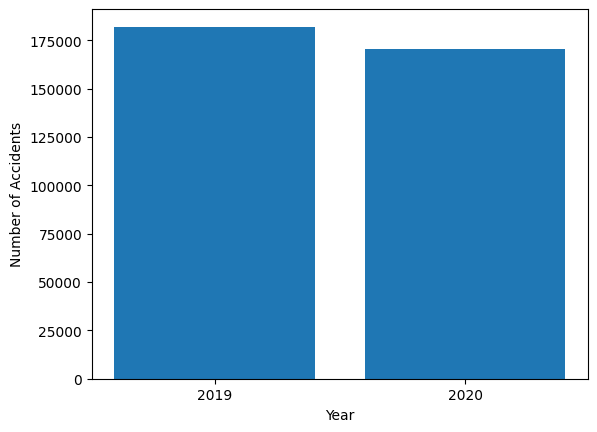

In [24]:
total_accidents_2019 = accident[accident['Accident Date'].dt.year == 2019]['Accident Date'].count()
total_accidents_2020 = accident[accident['Accident Date'].dt.year == 2020]['Accident Date'].count()

years = ['2019', '2020']
accidents = [total_accidents_2019, total_accidents_2020]


plt.bar(years, accidents)

plt.xlabel('Year')  
plt.ylabel('Number of Accidents') 
plt.show()

<h1>Question No.3: What is the average number of accidents per month?</h1>

In [25]:
average_accidents_per_month = accident['Accident Date'].groupby(accident['Accident Date'].dt.month).count().mean()
average_accidents_per_month

55056.583333333336

<h3>Insight No.3</h3>
<h4>The average number of accidents per month is 55,056.58.</h4>

<h1>No. 3 Visualization</h1>

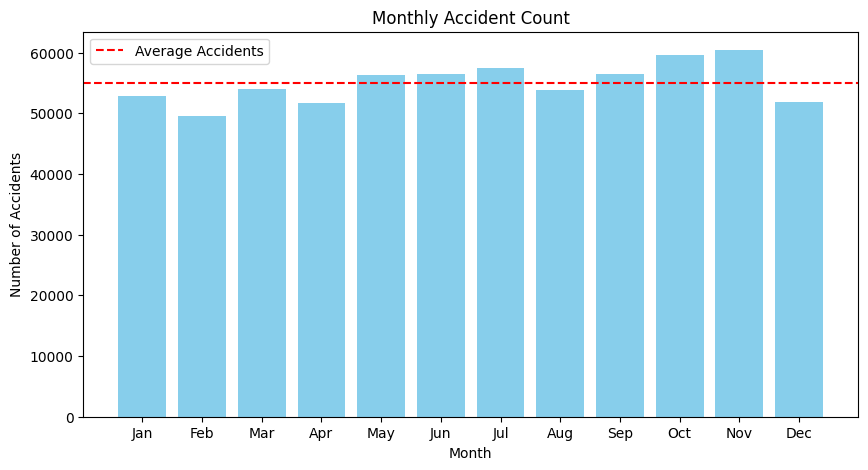

In [26]:
accidents_per_month = accident.groupby('Month').size()

plt.figure(figsize=(10, 5))
plt.bar(accidents_per_month.index, accidents_per_month.values, color='skyblue')
plt.axhline(y=accidents_per_month.mean(), color='r', linestyle='--', label='Average Accidents')

plt.xlabel("Month")
plt.ylabel("Number of Accidents")
plt.title("Monthly Accident Count")
plt.xticks(range(1, 13), ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.legend()
plt.show()

<h1>Question No.4: What is the most frequent accident severity?</h1>

In [27]:
severity_counts = accident['Accident_Severity'].value_counts()
severity_counts

Accident_Severity
Slight     563801
Serious     88217
Fatal        8661
Name: count, dtype: int64

<h3>Insight No.4</h3>
<h4>Most accidents are classified as Slight (563,801 accidents), followed by Serious (88,217 accidents) and Fatal (8,661 accidents).</h4>

<h1>No. 4 Visualization</h1>

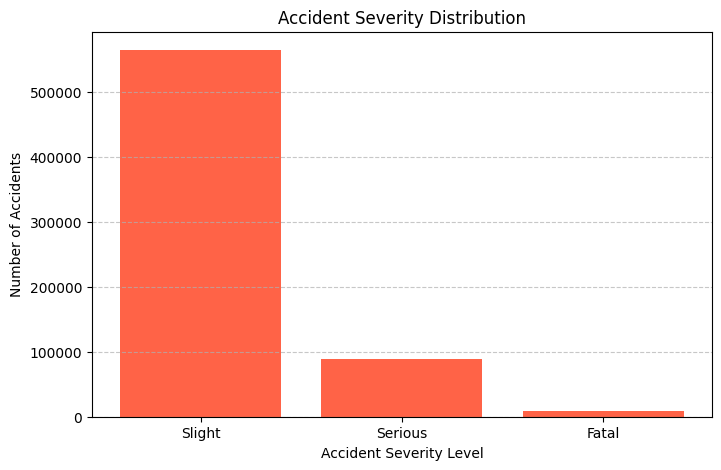

In [28]:
plt.figure(figsize=(8, 5))
plt.bar(severity_counts.index, severity_counts.values, color='tomato')

plt.xlabel("Accident Severity Level")
plt.ylabel("Number of Accidents")
plt.title("Accident Severity Distribution")
plt.xticks(rotation=0)  
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

<h1>Question No.5: What is the most common light condition during accidents?</h1>

In [29]:
most_common_light_condition = accident['Light_Conditions'].value_counts()
most_common_light_condition

Light_Conditions
Daylight                       484880
Darkness - lights lit          129335
Darkness - no lighting          37437
Darkness - lighting unknown      6484
Darkness - lights unlit          2543
Name: count, dtype: int64

<h3>Insight No.5</h3>
<h4>The highest number of accidents happened in Daylight, with 484,880 recorded incidents. Meanwhile, 129,335 accidents occurred in Darkness with street lights lit.</h4>

<h1>No.5 Visualization</h1>

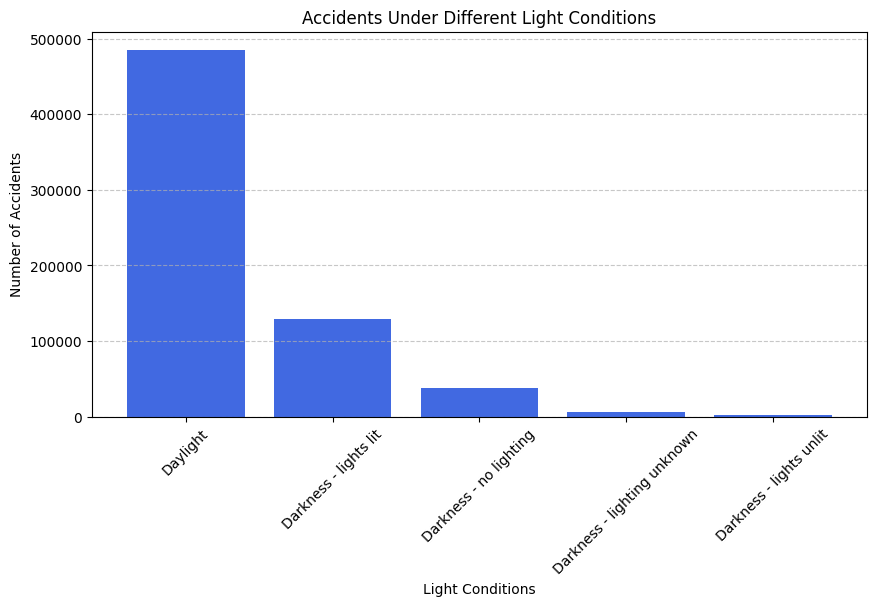

In [30]:
plt.figure(figsize=(10, 5))
plt.bar(most_common_light_condition.index, most_common_light_condition.values, color='royalblue')

plt.xlabel("Light Conditions")
plt.ylabel("Number of Accidents")
plt.title("Accidents Under Different Light Conditions")
plt.xticks(rotation=45)  
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

<h1>Question No.6: What is the most frequent weather condition during accidents?</h1>

In [31]:
most_frequent_weather = accident['Weather_Conditions'].value_counts()
most_frequent_weather

Weather_Conditions
Fine no high winds       520885
Raining no high winds     79696
Other                     17150
unaccounted               14128
Raining + high winds       9615
Fine + high winds          8554
Snowing no high winds      6238
Fog or mist                3528
Snowing + high winds        885
Name: count, dtype: int64

<h3>Insight No.6</h3>
<h4>The most common weather condition during accidents is "Fine no high winds" with 520,885 recorded incidents. </h4>

<h1>No.6 Visualization</h1>

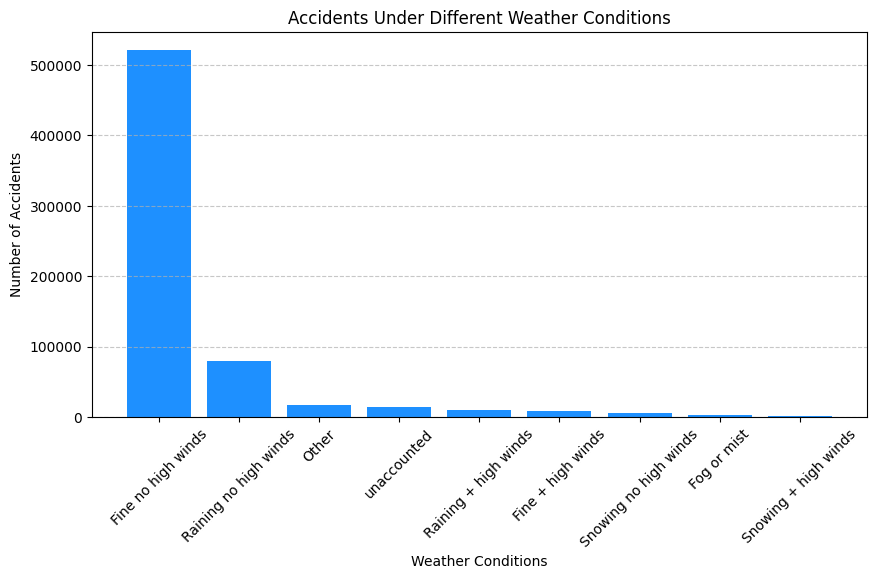

In [32]:
plt.figure(figsize=(10, 5))
plt.bar(most_frequent_weather.index, most_frequent_weather.values, color='dodgerblue')

plt.xlabel("Weather Conditions")
plt.ylabel("Number of Accidents")
plt.title("Accidents Under Different Weather Conditions")
plt.xticks(rotation=45) 
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

<h1>Question No.7: What is the average number of vehicles involved in each accident?</h1>

In [33]:
average_vehicles = accident['Number_of_Vehicles'].mean()
average_vehicles

1.8312554205597575

<h3>Insight No.7</h3>
<h4>Each accident involves an average of 1.83 vehicles.</h4>

<h1>No.7 Visualization</h1>

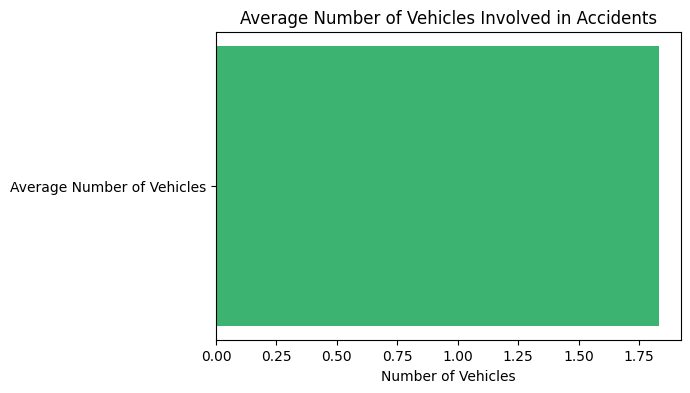

In [34]:
plt.figure(figsize=(6, 4))
plt.barh(['Average Number of Vehicles'], [average_vehicles], color='mediumseagreen')

plt.xlabel("Number of Vehicles")
plt.title("Average Number of Vehicles Involved in Accidents")
plt.show()

<h1>Question No.8: What is the most common road surface condition where accidents occurred?</h1>

In [35]:
most_common_surface = accident['Road_Surface_Conditions'].value_counts()
most_common_surface

Road_Surface_Conditions
Dry                          447821
Wet or damp                  186708
Frost or ice                  18517
Snow                           5890
Flood over 3cm. deep           1017
unknown surface condition       726
Name: count, dtype: int64

<h3>Insight No.8</h3>
<h4>The majority of accidents occurred on dry roads, with 447,821 recorded incidents.</h4>

<h1>No.8 Visualization</h1>

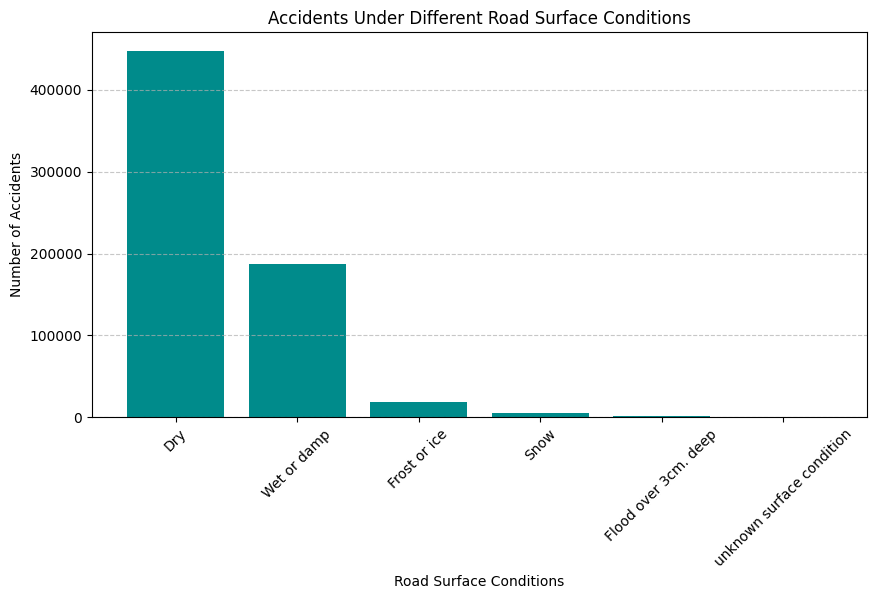

In [36]:
plt.figure(figsize=(10, 5))
plt.bar(most_common_surface.index, most_common_surface.values, color='darkcyan')

plt.xlabel("Road Surface Conditions")
plt.ylabel("Number of Accidents")
plt.title("Accidents Under Different Road Surface Conditions")
plt.xticks(rotation=45) 
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

<h1>Question No.9: Which day of the week had the highest number of accidents?</h1>

In [37]:
day_accidents = accident['DayofWeek'].value_counts()
day_accidents

DayofWeek
5    107178
2     99558
3     99511
4     97900
1     94550
6     89302
0     72680
Name: count, dtype: int64

<h3>Insight No.9</h3>
<h4>Friday (Day 5) recorded the highest number of accidents, with 107,178 incidents.</h4>

<h1>No.9 Visualization</h1>

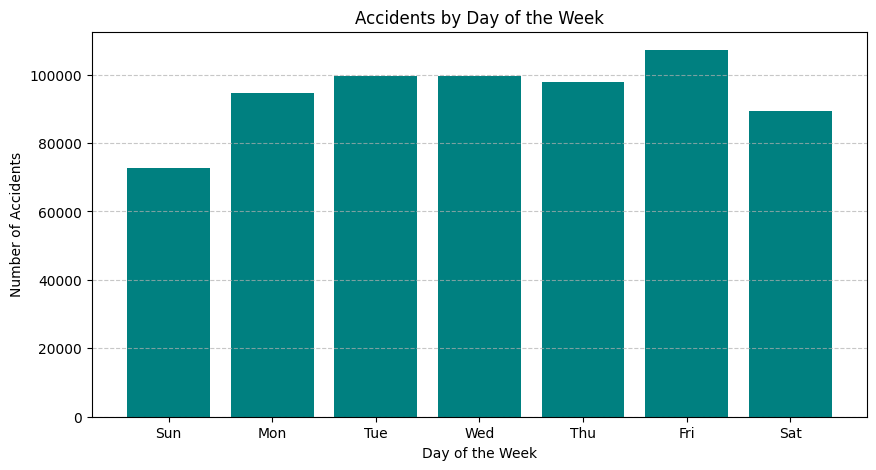

In [38]:
days_of_week = ["Sun", "Mon", "Tue", "Wed", "Thu", "Fri", "Sat"]

plt.figure(figsize=(10, 5))
plt.bar(day_accidents.index, day_accidents.values, color='teal')

plt.xlabel("Day of the Week")
plt.ylabel("Number of Accidents")
plt.title("Accidents by Day of the Week")
plt.xticks(range(7), days_of_week) 
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

<h1>Question No.10: Which road type experienced the most accidents?</h1>

In [39]:
road_type_counts = accident['Road_Type'].value_counts()
road_type_counts

Road_Type
Single carriageway    492143
Dual carriageway       99424
Roundabout             43992
One way street         13559
Slip road               7041
unaccounted             4520
Name: count, dtype: int64

<h3>Insight No.10</h3>
<h4>The most accidents occurred on Single Carriageway roads, with 492,143 recorded incidents. </h4>

<h1>No.10 Visualization</h1>

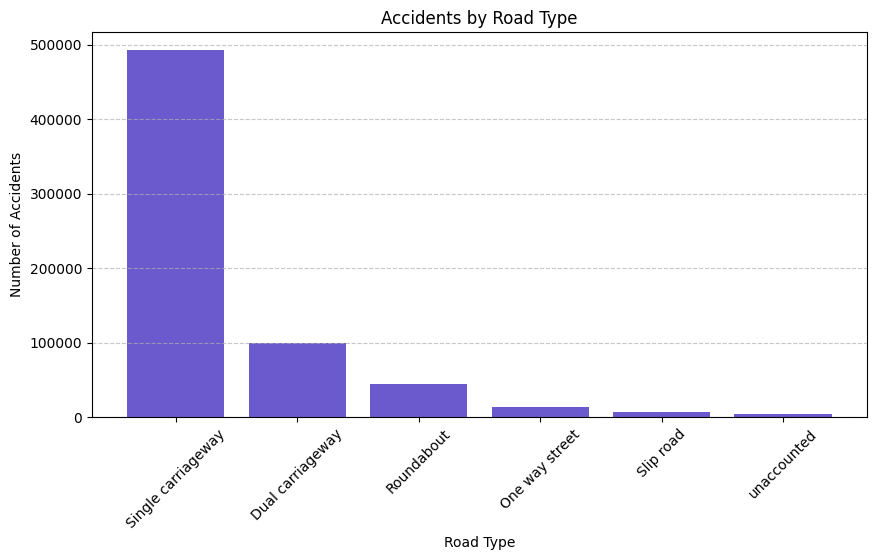

In [40]:
plt.figure(figsize=(10, 5))
plt.bar(road_type_counts.index, road_type_counts.values, color='slateblue')

plt.xlabel("Road Type")
plt.ylabel("Number of Accidents")
plt.title("Accidents by Road Type")
plt.xticks(rotation=45)  
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

<h1>BiVariate</h1>

<h1>Question No.11: How does weather affect the number of accidents?</h1>

In [41]:
weather_accidents = accident.groupby('Weather_Conditions')['Accident Date'].count().sort_values(ascending=False)
weather_accidents

Weather_Conditions
Fine no high winds       520885
Raining no high winds     79696
Other                     17150
unaccounted               14128
Raining + high winds       9615
Fine + high winds          8554
Snowing no high winds      6238
Fog or mist                3528
Snowing + high winds        885
Name: Accident Date, dtype: int64

<h3>Insight No.11</h3>
<h4>The highest number of accidents occurred under fine weather with no high winds (520,885 cases), likely due to more vehicles being on the road. However, rainy conditions (79,696 cases) and fog/mist (3,528 cases) significantly increased accident rates compared to normal weather.</h4>

<h1>No.11 Visualization</h1>

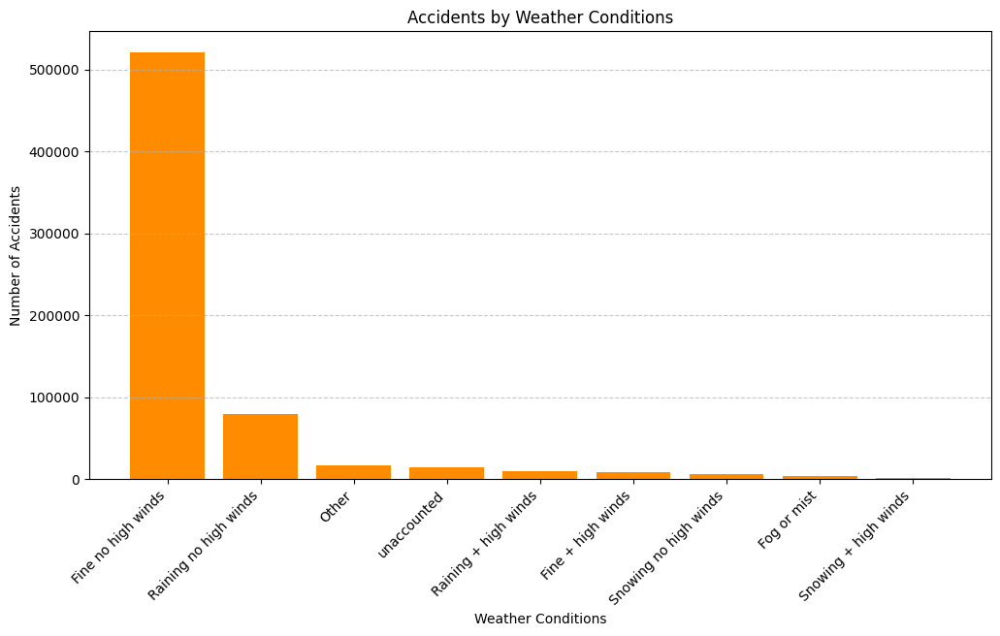

In [42]:
plt.figure(figsize=(12, 6))
plt.bar(weather_accidents.index, weather_accidents.values, color='darkorange')

plt.xlabel("Weather Conditions")
plt.ylabel("Number of Accidents")
plt.title("Accidents by Weather Conditions")
plt.xticks(rotation=45, ha='right')  
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

<h1>Question No.12: What is the average number of casualties on different road surface conditions?</h1>

In [43]:
avg_casualties_per_surface = accident.groupby('Road_Surface_Conditions')['Number_of_Casualties'].mean()
avg_casualties_per_surface

Road_Surface_Conditions
Dry                          1.334736
Flood over 3cm. deep         1.495575
Frost or ice                 1.348815
Snow                         1.359593
Wet or damp                  1.411064
unknown surface condition    1.216253
Name: Number_of_Casualties, dtype: float64

<h3>Insight No.12</h3>
<h4>It shows that roads with flooding over 3cm deep have the highest average number of casualties at 1.50 per accident, followed by wet or damp roads at 1.41 casualties per accident. Roads covered in snow (1.36), frost or ice (1.35), and dry conditions (1.33) also present risks. While, the lowest casualty rate is observed in unknown surface conditions (1.22 casualties per accident).</h4>

<h1>No.12 Visualization</h1>

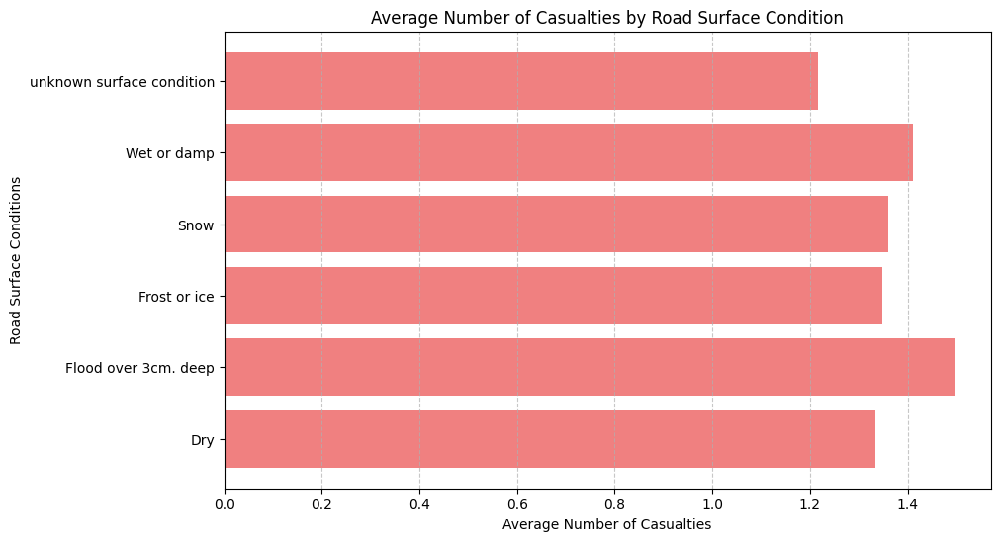

In [44]:
plt.figure(figsize=(10, 6))
plt.barh(avg_casualties_per_surface.index, avg_casualties_per_surface.values, color='lightcoral')

plt.xlabel("Average Number of Casualties")
plt.ylabel("Road Surface Conditions")
plt.title("Average Number of Casualties by Road Surface Condition")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

<h1>Question No.13: How do weather conditions relate to light conditions in road accidents?</h1>

In [45]:
weather_light_condition = accident.groupby(['Weather_Conditions', 'Light_Conditions'])['Accident Date'].count()
weather_light_condition

Weather_Conditions     Light_Conditions           
Fine + high winds      Darkness - lighting unknown        59
                       Darkness - lights lit            1852
                       Darkness - lights unlit            51
                       Darkness - no lighting            796
                       Daylight                         5796
Fine no high winds     Darkness - lighting unknown      3683
                       Darkness - lights lit           91951
                       Darkness - lights unlit          1700
                       Darkness - no lighting          24867
                       Daylight                       398684
Fog or mist            Darkness - lighting unknown        65
                       Darkness - lights lit             921
                       Darkness - lights unlit            37
                       Darkness - no lighting            862
                       Daylight                         1643
Other                  Darkness - 

<h3>Insight No.13</h3>
<h4>Most accidents occur in clear weather during daylight, but foggy and rainy conditions increase accidents in low-light conditions. </h4>

<h1>No.13 Visualization</h1>

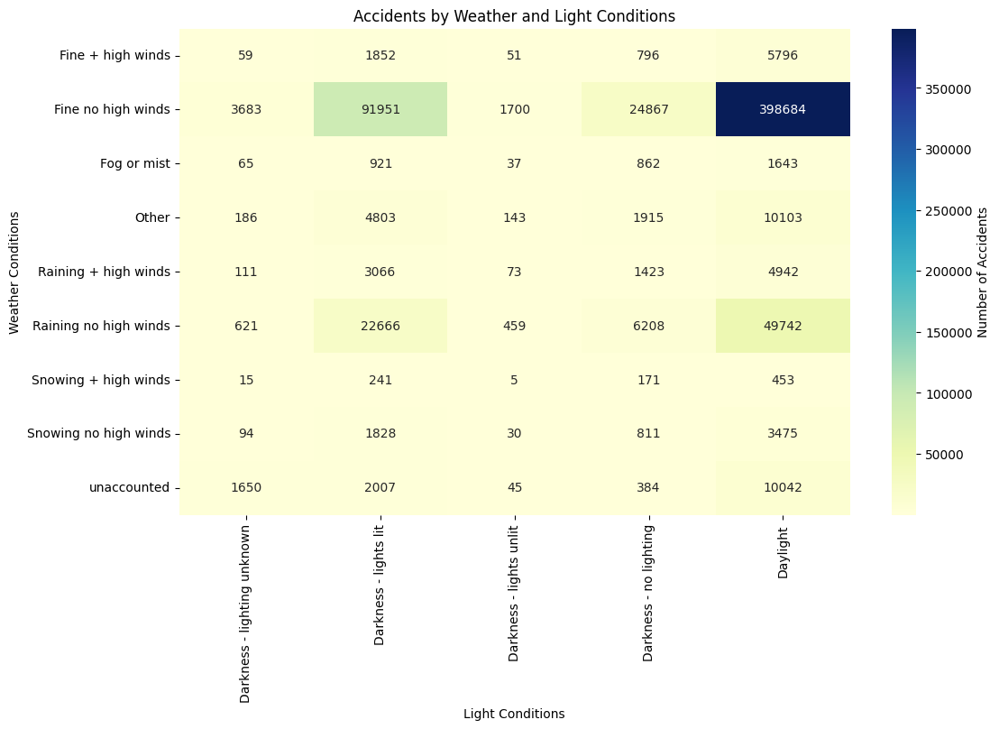

In [46]:
weather_light_condition = accident.groupby(['Weather_Conditions', 'Light_Conditions']).size().unstack(fill_value=0)

plt.figure(figsize=(12, 7))
sns.heatmap(weather_light_condition, annot=True, fmt="d", cmap="YlGnBu", cbar_kws={'label': 'Number of Accidents'})

plt.xlabel("Light Conditions")
plt.ylabel("Weather Conditions")
plt.title("Accidents by Weather and Light Conditions")

plt.show()

<h1>MultiVariate</h1>

In [47]:
#Accident Per Year
accidents_per_year = accident['Year'].value_counts().sort_index()

#Float might be caused of values without year
# accident = accident['Year'].dropna()
# Accident per month
accidents_per_month = accident['Month'].value_counts().sort_index()

In [48]:
accidents_per_year

Year
2019    182115
2020    170591
2021    163554
2022    144419
Name: count, dtype: int64

In [49]:
accidents_per_month

Month
1     52872
2     49491
3     54086
4     51744
5     56352
6     56481
7     57445
8     53913
9     56455
10    59580
11    60424
12    51836
Name: count, dtype: int64

<h1>Question No.14: How does bad weather combined with poor road surface conditions affect accident risks?</h1>

In [50]:
bad_weather_accidents = accident[(accident['Weather_Conditions'] == 'Rain') | 
                           (accident['Weather_Conditions'] == 'Snow') | 
                           (accident['Weather_Conditions'] == 'Fog') | 
                           (accident['Weather_Conditions'] == 'Storm')]

poor_road_accidents = accident[(accident['Road_Surface_Conditions'] == 'Wet or damp') | 
                         (accident['Road_Surface_Conditions'] == 'Snow') | 
                         (accident['Road_Surface_Conditions'] == 'Frost or ice') | 
                         (accident['Road_Surface_Conditions'] == 'Flood over 3cm')]

combined_accidents = bad_weather_accidents['Accident Date'].count() + poor_road_accidents['Accident Date'].count()

combined_accidents

211115

<h3>Insight No.14</h3>
<h4>A total of 211,115 accidents occurred under bad weather conditions (rain, snow, fog, or storms) combined with poor road surfaces (wet, icy, snowy, or flooded roads). </h4>

<h1>No.14 Visualization</h1>

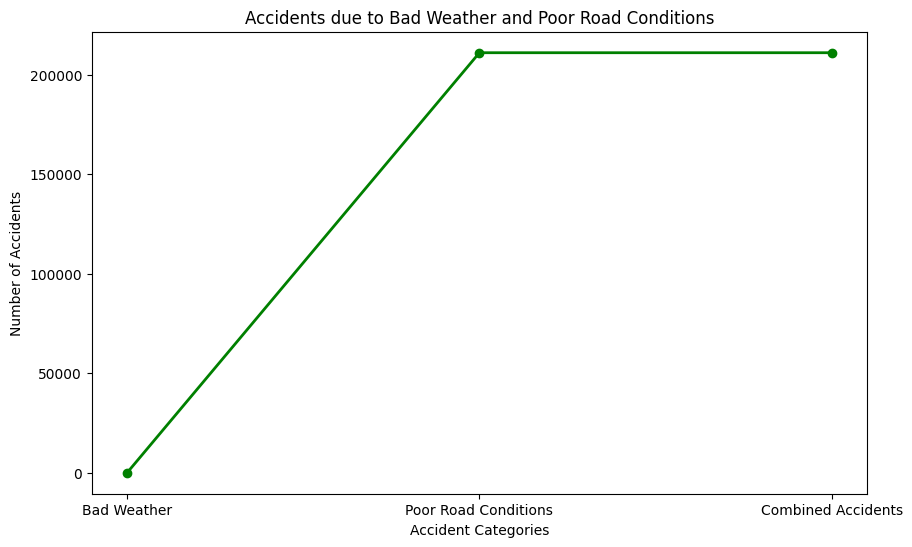

In [51]:
bad_weather_accidents_count = accident[accident['Weather_Conditions'].isin(['Rain', 'Snow', 'Fog', 'Storm'])]['Accident Date'].count()

poor_road_accidents_count = accident[accident['Road_Surface_Conditions'].isin(['Wet or damp', 'Snow', 'Frost or ice', 'Flood over 3cm'])]['Accident Date'].count()

combined_accidents = bad_weather_accidents_count + poor_road_accidents_count

categories = ['Bad Weather', 'Poor Road Conditions', 'Combined Accidents']
counts = [bad_weather_accidents_count, poor_road_accidents_count, combined_accidents]

plt.figure(figsize=(10, 6))
plt.plot(categories, counts, marker='o', color='green', linestyle='-', linewidth=2)
plt.xlabel('Accident Categories')
plt.ylabel('Number of Accidents')
plt.title('Accidents due to Bad Weather and Poor Road Conditions')

plt.show()

<h1>Question No.15: Do winter months have higher accident rates due to unwanted weather conditions?</h1>

In [52]:
winter_accidents = accident[(accident['Month'] == 12) | (accident['Month'] == 1) | (accident['Month'] == 2)]['Month'].count()
total_accidents = accident['Month'].count()

winter_percentage = (winter_accidents / total_accidents) * 100
winter_accidents, winter_percentage

(154199, 23.339473481070232)

<h3>Insight No.15</h3>
<h4>It shows that 154,199 accidents occurred during the winter months, making up 23.34% of the total accidents.</h4>

<h1>No.15 Visualization</h1>

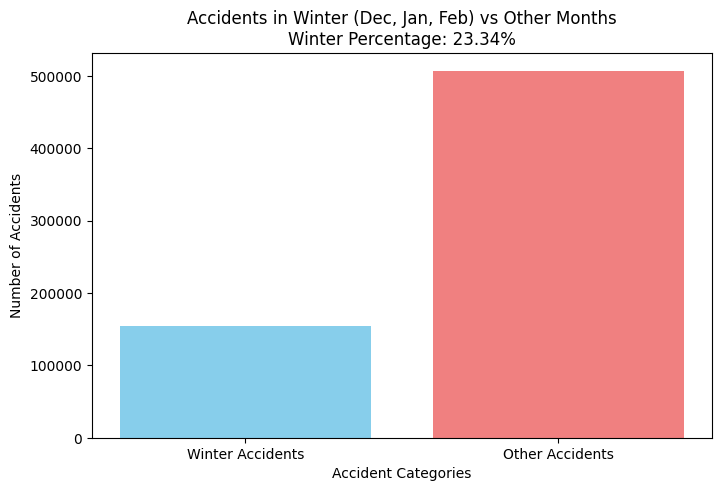

In [53]:
categories = ['Winter Accidents', 'Other Accidents']
counts = [winter_accidents, total_accidents - winter_accidents]

plt.figure(figsize=(8, 5))
plt.bar(categories, counts, color=['skyblue', 'lightcoral'])

plt.xlabel('Accident Categories')
plt.ylabel('Number of Accidents')
plt.title(f'Accidents in Winter (Dec, Jan, Feb) vs Other Months\nWinter Percentage: {winter_percentage:.2f}%')
plt.show()

<h1>Question No.16: How do weather conditions, road surface conditions, and accident severity interact?</h1>

In [54]:
weather_road_severity = accident.groupby(['Weather_Conditions', 'Road_Surface_Conditions'])['Accident_Severity'].value_counts()
weather_road_severity

Weather_Conditions  Road_Surface_Conditions    Accident_Severity
Fine + high winds   Dry                        Slight               4162
                                               Serious               758
                                               Fatal                 103
                    Flood over 3cm. deep       Slight                 14
                                               Fatal                   1
                                                                    ... 
unaccounted         Wet or damp                Serious               169
                                               Fatal                  29
                    unknown surface condition  Slight                550
                                               Serious                61
                                               Fatal                   1
Name: count, Length: 162, dtype: int64

<h3>Insight No.16</h3>
<h4>It shows that most accidents occur in "Fine + high winds" conditions on dry roads, with 4,162 slight accidents, 758 serious accidents, and 103 fatal accidents. However, accidents on flooded roads, though less frequent, show a higher fatality percentage.</h4>

<h1>No.16 Visualization</h1>

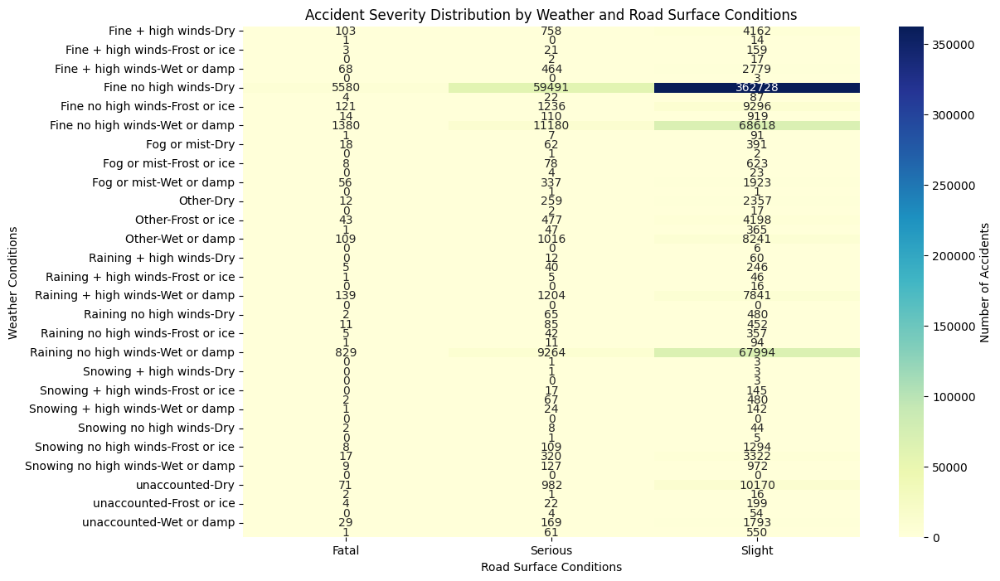

In [55]:
weather_road_pivot = weather_road_severity.unstack(fill_value=0)

plt.figure(figsize=(12, 8))
sns.heatmap(weather_road_pivot, annot=True, fmt='d', cmap="YlGnBu", cbar_kws={'label': 'Number of Accidents'})

plt.title('Accident Severity Distribution by Weather and Road Surface Conditions')
plt.xlabel('Road Surface Conditions')
plt.ylabel('Weather Conditions')

plt.show()

<h1>Question No.17: How do road type, light conditions, and accident severity relate to each other?</h1>

In [56]:
road_light_severity = accident.groupby(['Road_Type', 'Light_Conditions'])['Accident_Severity'].value_counts()
road_light_severity

Road_Type         Light_Conditions             Accident_Severity
Dual carriageway  Darkness - lighting unknown  Slight                 805
                                               Serious                 93
                                               Fatal                    7
                  Darkness - lights lit        Slight               17025
                                               Serious               2762
                                                                    ...  
unaccounted       Darkness - no lighting       Serious                 33
                                               Fatal                    1
                  Daylight                     Slight                3098
                                               Serious                349
                                               Fatal                   22
Name: count, Length: 90, dtype: int64

<h3>Insight No.17</h3>
<h4>Most accidents happen on dual carriageways under daylight conditions, with 17,025 slight, 2,762 serious, and 22 fatal accidents.</h4>

<h1>No.17 Visualization</h1>

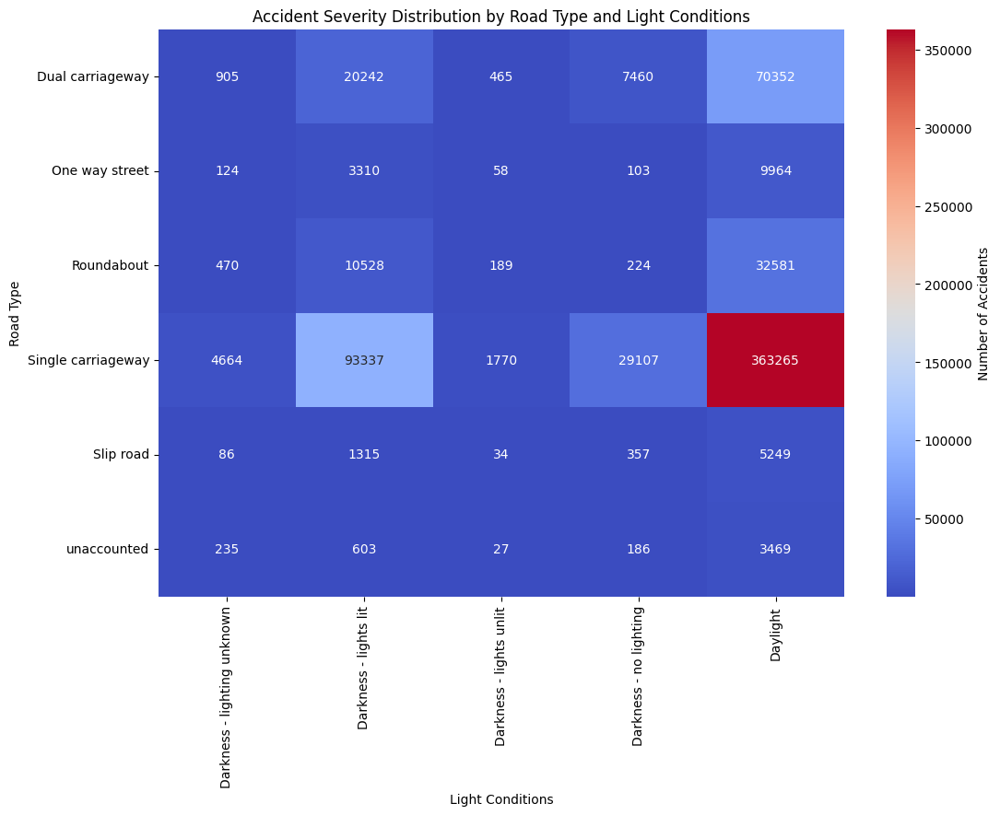

In [57]:
road_light_pivot = accident.groupby(['Road_Type', 'Light_Conditions'])['Accident_Severity'].count().unstack().fillna(0)
    
plt.figure(figsize=(12, 8))
sns.heatmap(road_light_pivot, annot=True, fmt='d', cmap="coolwarm", cbar_kws={'label': 'Number of Accidents'})

plt.title('Accident Severity Distribution by Road Type and Light Conditions')
plt.xlabel('Light Conditions')
plt.ylabel('Road Type')

plt.show()

<h1>Question No.18: How do vehicle type, urban/rural area, and accident severity correlate?</h1>

In [58]:
vehicle_area_severity = accident.groupby(['Vehicle_Type', 'Urban_or_Rural_Area'])['Accident_Severity'].value_counts()
vehicle_area_severity

Vehicle_Type                         Urban_or_Rural_Area  Accident_Severity
Agricultural vehicle                 Rural                Slight                 540
                                                          Serious                121
                                                          Fatal                   14
                                     Unallocated          Fatal                    0
                                                          Serious                  0
                                                                               ...  
Van / Goods 3.5 tonnes mgw or under  Unallocated          Slight                   0
                                                          Fatal                    0
                                     Urban                Slight               19135
                                                          Serious               2707
                                                          Fatal           

<h3>Insight No.18</h3>
<h4>Most accidents involving vans and goods vehicles happen in urban areas, with 19,135 slight, 2,707 serious, and 161 fatal accidents. </h4>

<h1>No.18 Visualization</h1>

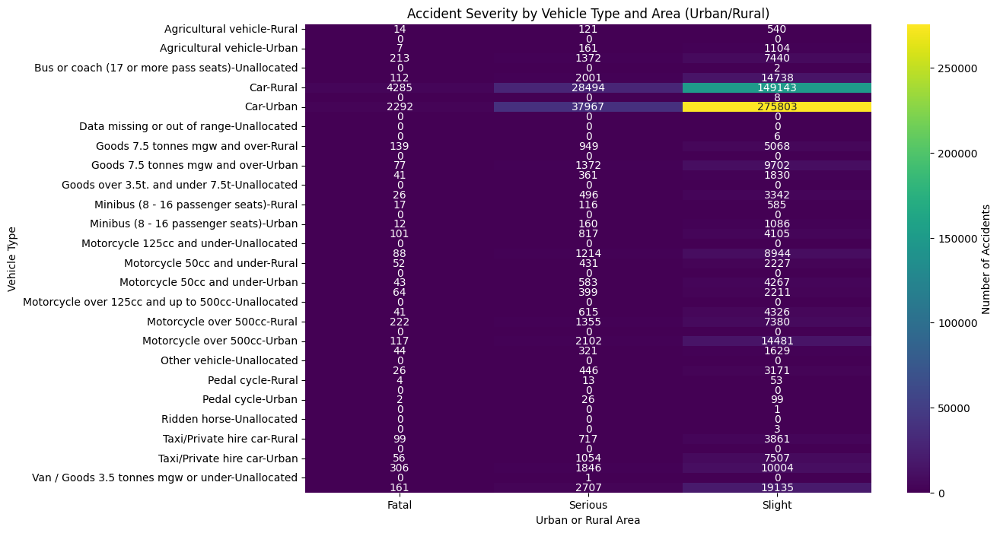

In [59]:
vehicle_area_pivot = vehicle_area_severity.unstack(fill_value=0)

plt.figure(figsize=(12, 8))
sns.heatmap(vehicle_area_pivot, annot=True, fmt='d', cmap="viridis", cbar_kws={'label': 'Number of Accidents'})

plt.title('Accident Severity by Vehicle Type and Area (Urban/Rural)')
plt.xlabel('Urban or Rural Area')
plt.ylabel('Vehicle Type')

plt.show()

<h1>Question No.19: How does the combination of weather conditions, road type, and accident severity affect the number of casualties in road accidents across different years?</h1>

In [60]:
casualties_by_factors = accident.groupby(['Year', 'Weather_Conditions', 'Road_Type', 'Accident_Severity'])['Number_of_Casualties'].sum().reset_index()
casualties = casualties_by_factors.pivot_table(index=['Year', 'Weather_Conditions', 'Road_Type'],
                                                     columns='Accident_Severity',
                                                     values='Number_of_Casualties',
                                                     aggfunc='sum').fillna(0)

casualties

Accident_Severity                           Fatal  Serious  Slight
Year Weather_Conditions Road_Type                                 
2019 Fine + high winds  Dual carriageway       22       67     548
                        One way street          2        9      45
                        Roundabout              1       19     178
                        Single carriageway     92      415    2004
                        Slip road               0        4      35
...                                           ...      ...     ...
2022 unaccounted        One way street          0        7      67
                        Roundabout              1       11     303
                        Single carriageway     29      233    2130
                        Slip road               0        0      41
                        unaccounted             0        3      82

[216 rows x 3 columns]

<h3>Insight No.19</h3>
<h4>Accidents in 2019 and 2022 show that dual carriageways and single carriageways are the most common road types for accidents, with serious accidents occurring more often on dual carriageways.</h4>

<h1>No.19 Visualization</h1>

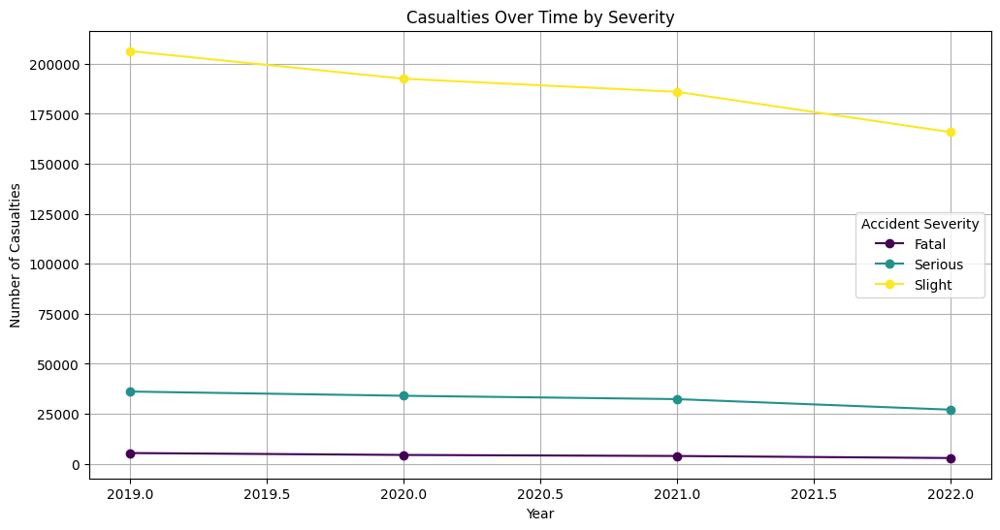

In [61]:
casualties_by_year = casualties_by_factors.groupby(['Year', 'Accident_Severity'])['Number_of_Casualties'].sum().unstack()

casualties_by_year.plot(kind='line', marker='o', figsize=(12, 6), cmap='viridis')
plt.title('Casualties Over Time by Severity')
plt.xlabel('Year')
plt.ylabel('Number of Casualties')
plt.legend(title='Accident Severity')
plt.grid(True)
plt.show()

<h1>Question No.20: How do different vehicle types and road conditions contribute to the severity of road accidents?</h1>

In [62]:
accident_severity_by_factors = accident.groupby(['Vehicle_Type', 'Road_Surface_Conditions', 'Accident_Severity']).size().unstack().fillna(0)
accident_severity_by_factors_sorted = accident_severity_by_factors.sort_values(by=['Fatal', 'Serious'], ascending=False)

accident_severity_by_factors_sorted

Accident_Severity                                               Fatal  \
Vehicle_Type                         Road_Surface_Conditions            
Car                                  Dry                         4403   
                                     Wet or damp                 1981   
Van / Goods 3.5 tonnes mgw or under  Dry                          311   
Bus or coach (17 or more pass seats) Dry                          220   
Motorcycle over 500cc                Dry                          217   
...                                                               ...   
Ridden horse                         Flood over 3cm. deep           0   
                                     Frost or ice                   0   
                                     Snow                           0   
                                     Wet or damp                    0   
                                     unknown surface condition      0   

Accident_Severity                                               Serious  \
Vehicle_Type                         Road_Surface_Conditions              
Car                                  Dry                          46458   
                                     Wet or damp                  17905   
Van / Goods 3.5 tonnes mgw or under  Dry                           3165   
Bus or coach (17 or more pass seats) Dry                           2367   
Motorcycle over 500cc                Dry                           2412   
...                                                                 ...   
Ridden horse                         Flood over 3cm. deep             0   
                                     Frost or ice                     0   
                                     Snow                             0   
                                     Wet or damp                      0   
                                     unknown surface condition        0   

Accident_Severity                                               Slight  
Vehicle_Type                         Road_Surface_Conditions            
Car                                  Dry                        286450  
                                     Wet or damp                120878  
Van / Goods 3.5 tonnes mgw or under  Dry                         19606  
Bus or coach (17 or more pass seats) Dry                         15017  
Motorcycle over 500cc                Dry                         14809  
...                                                                ...  
Ridden horse                         Flood over 3cm. deep            0  
                                     Frost or ice                    0  
                                     Snow                            0  
                                     Wet or damp                     1  
                                     unknown surface condition       0  

[96 rows x 3 columns]

<h3>Insight No.20</h3>
<h4>Most accidents, especially fatal ones, occur on dry roads, with cars having the highest frequency. Wet or damp roads also contribute to accidents, but they are less severe compared to dry conditions, especially for vehicles like buses and motorcycles.</h4>

<h1>No.20 Visualization</h1>

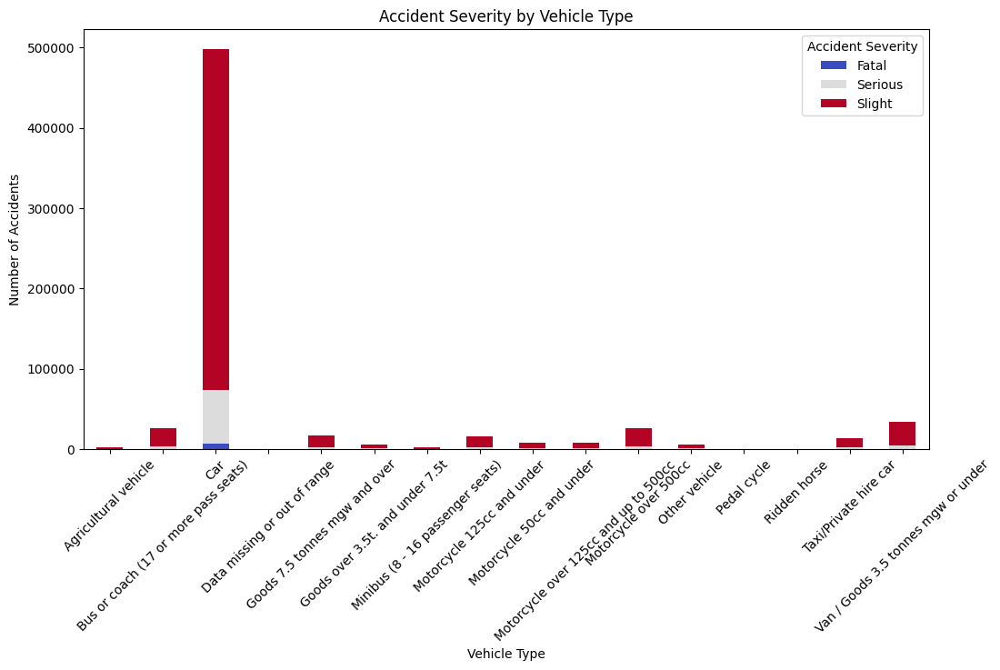

In [63]:
accident_severity_by_vehicle = accident_severity_by_factors.groupby('Vehicle_Type').sum()

accident_severity_by_vehicle.plot(kind='bar', stacked=True, figsize=(12, 6), cmap='coolwarm')
plt.title('Accident Severity by Vehicle Type')
plt.xlabel('Vehicle Type')
plt.ylabel('Number of Accidents')
plt.legend(title='Accident Severity')
plt.xticks(rotation=45)
plt.show()

<h1>Question 21</h1>
<h1>Which district areas have the highest accident frequency for the differenet levels of accident severity?</h1>

In [64]:
accident_by_area_severity = accident.groupby(['District Area', 'Accident_Severity']).size().reset_index(name='Accident_Count')
accident_by_area_severity 

,District Area,Accident_Severity,Accident_Count
0,Aberdeen City,Fatal,12
1,Aberdeen City,Serious,239
2,Aberdeen City,Slight,1072
3,Aberdeenshire,Fatal,66
4,Aberdeenshire,Serious,463
...,...,...,...
1261,Wyre Forest,Serious,132
1262,Wyre Forest,Slight,815
1263,York,Fatal,21
1264,York,Serious,255


<h1>Insight 21</h1>
<h3>The district in Aberdeenshire with the highest accident frequency also has the greatest number of fatal accidents. Meanwhile, urban areas like York experience fewer, less severe accidents.</h3>

<h1>No.21 Visualization</h1>

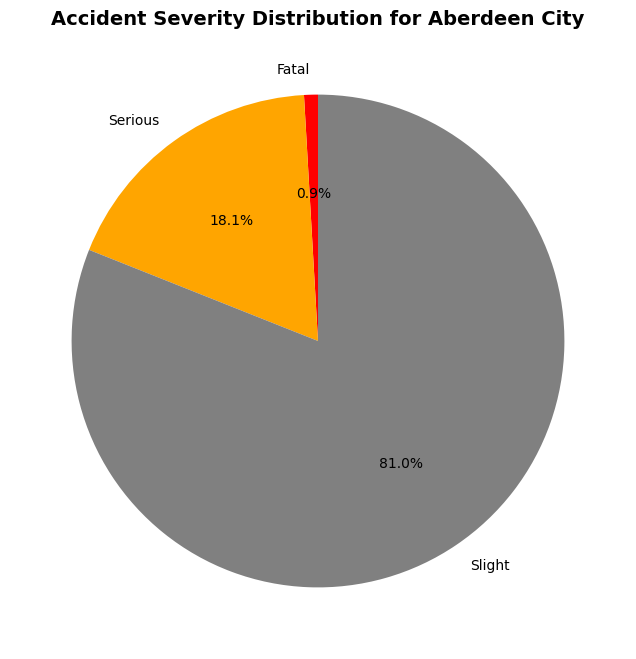

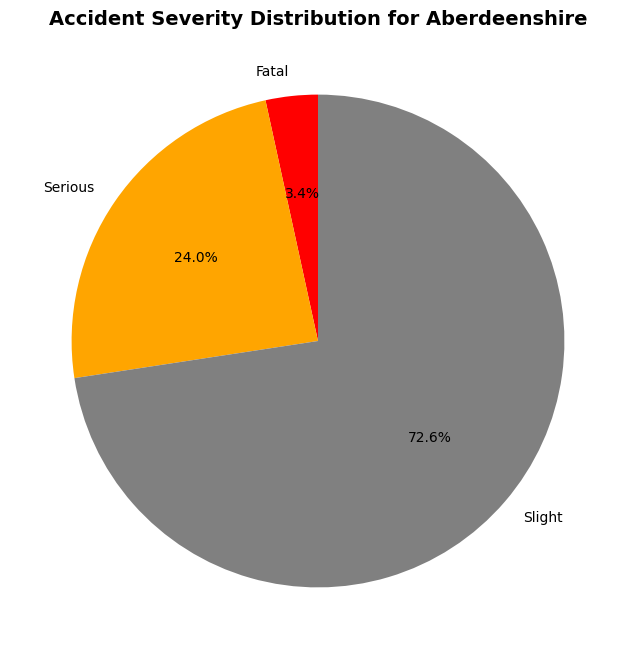

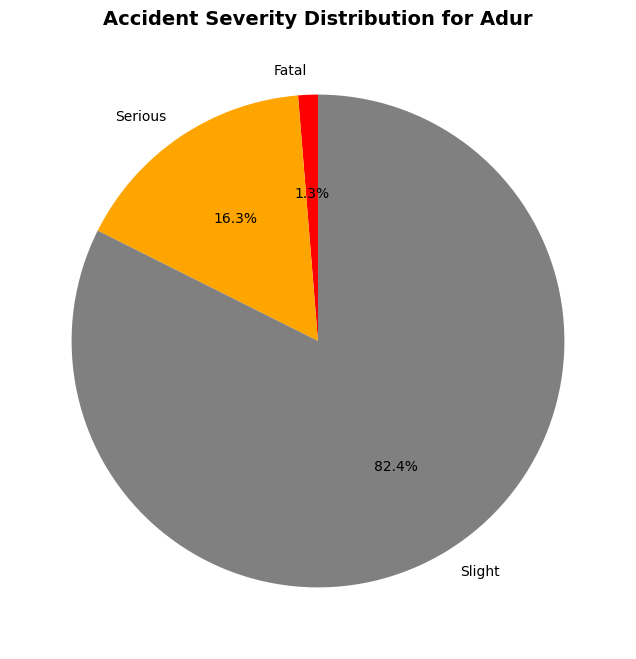

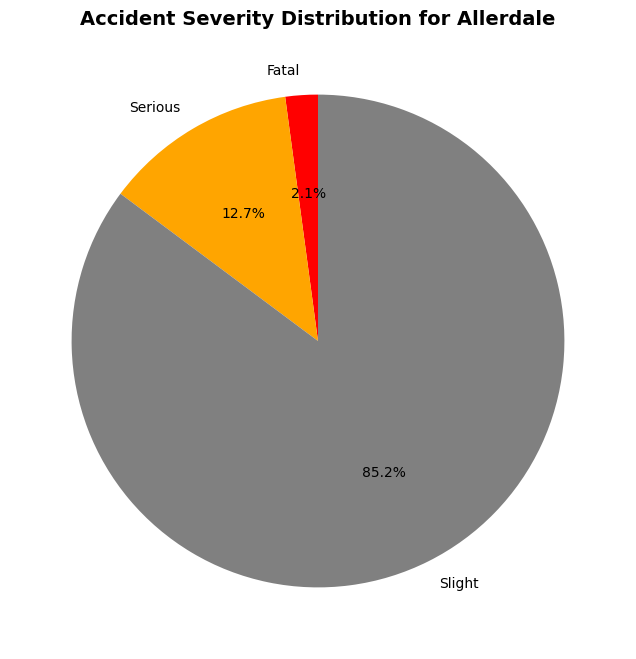

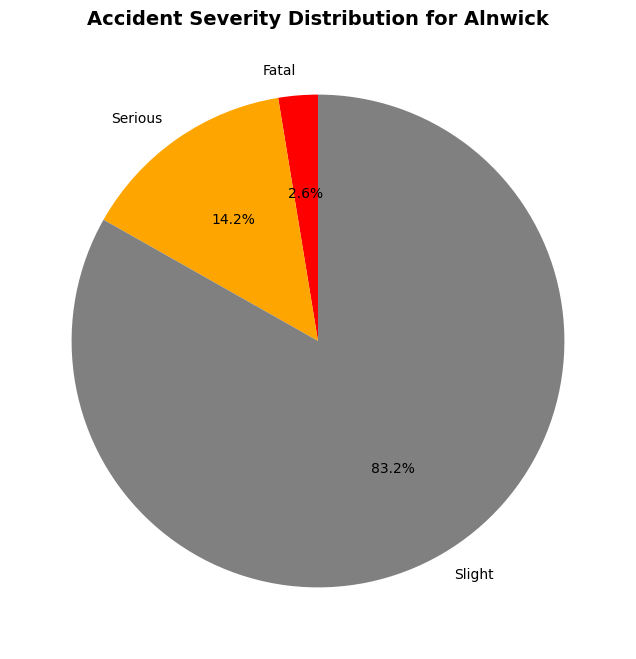

...

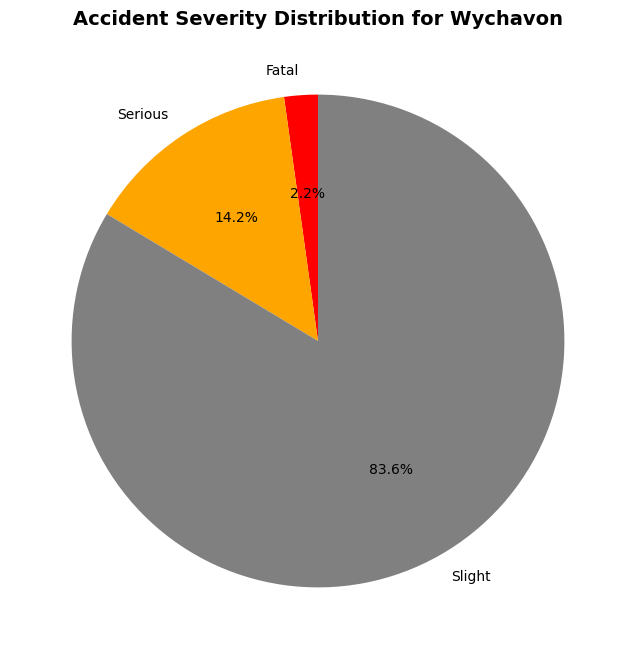

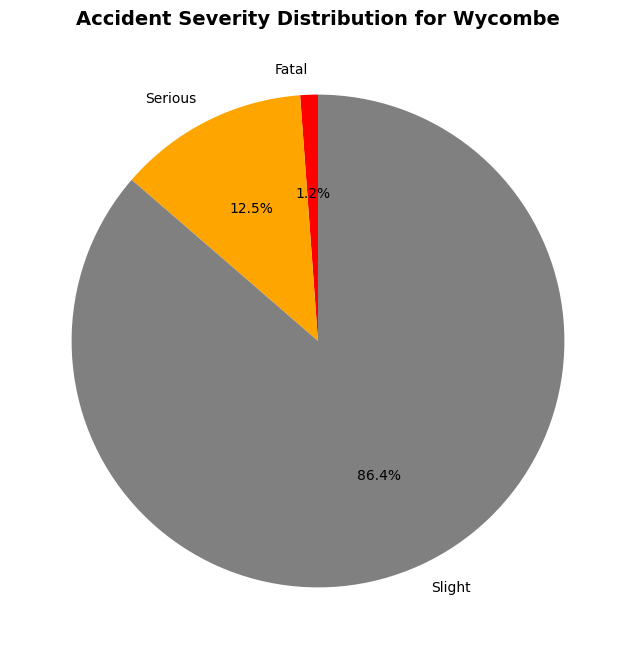

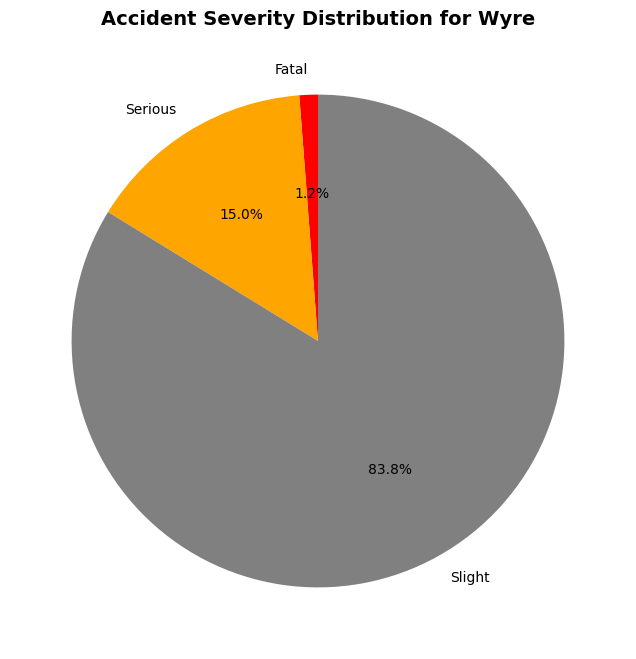

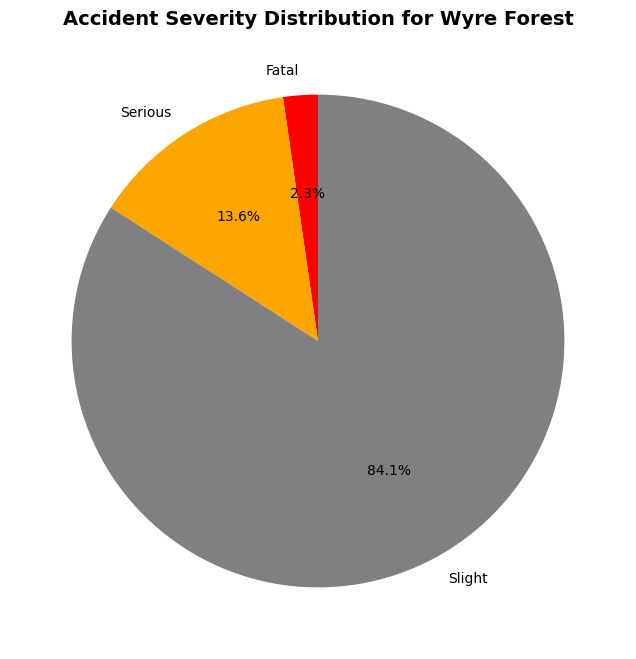

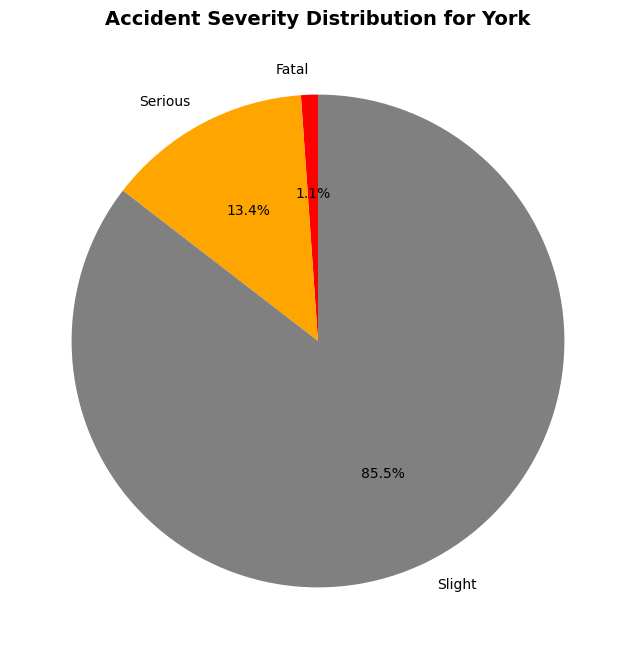

In [65]:
pivot_data = accident_by_area_severity.pivot_table(index='District Area', columns='Accident_Severity', values='Accident_Count', aggfunc='sum').fillna(0)

severity_colors = {
    'Fatal': 'red',
    'Serious': 'orange',
    'Minor': 'yellow',
    'No Injury': 'green'
}

for district in pivot_data.index:
    plt.figure(figsize=(8, 8))
    district_data = pivot_data.loc[district]

    colors = [severity_colors.get(severity, 'gray') for severity in district_data.index]
    plt.pie(district_data, labels=district_data.index, autopct='%1.1f%%', startangle=90, colors=colors)
    plt.title(f'Accident Severity Distribution for {district}', fontsize=14, fontweight='bold')
    plt.show()

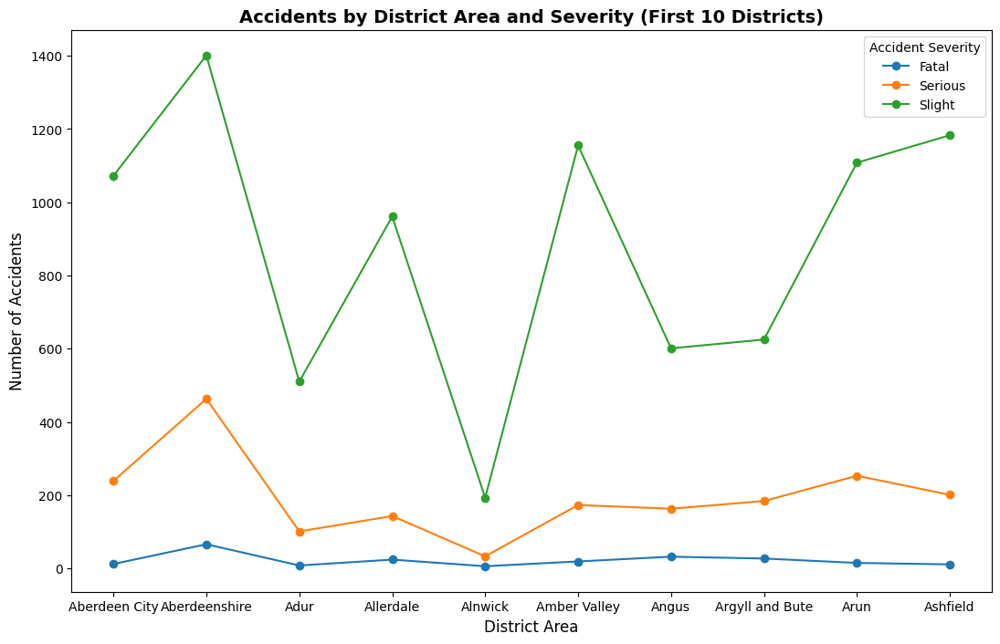

In [77]:
pivot_area_severity = accident_by_area_severity.pivot(index='District Area', columns='Accident_Severity', values='Accident_Count').fillna(0)
pivot_area_severity_limited = pivot_area_severity.head(10)

count = 0
for x in pivot_area_severity_limited.columns:
    count += 1
    plt.plot(pivot_area_severity_limited.index, pivot_area_severity_limited[x], label=x, marker='o')

plt.gcf().set_size_inches(13, 8)
plt.title('Accidents by District Area and Severity (First 10 Districts)', fontsize=14, fontweight='bold')
plt.xlabel('District Area', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.legend(title='Accident Severity')
plt.show()

<h1>Question 22</h1>
<h1>Which month has the highest number of accidents based on the dataset?</h1>

In [78]:
accidents_by_month = accident.groupby('Month').size()
most_accidents = accidents_by_month.sort_values(ascending=False).head(1)

most_accidents

Month
11    60424
dtype: int64

<h1>Insight 22</h1>
<h3>The month with the highest number of accidents is November, with 60,424 accidents.</h3>

<h1>No.22 Visualization</h1>

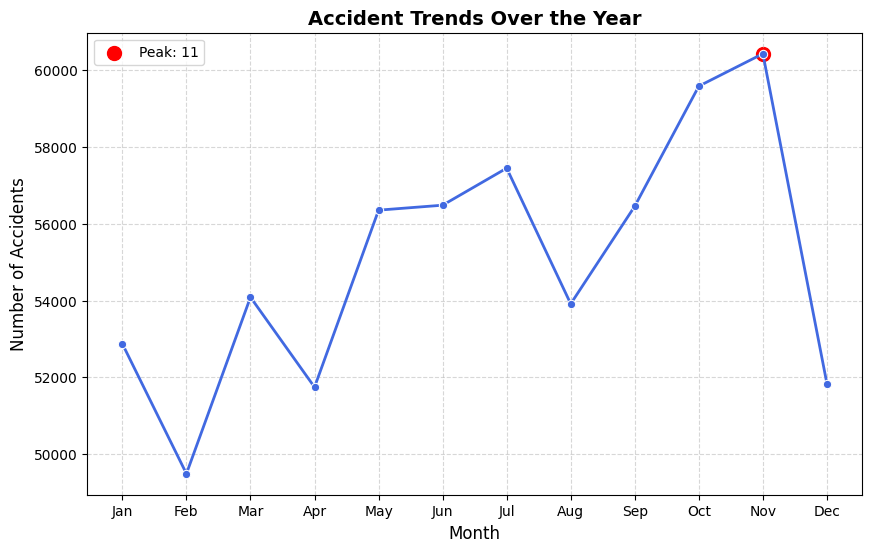

In [79]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=accidents_by_month.index, y=accidents_by_month.values, marker='o', linewidth=2, color='royalblue')

plt.title('Accident Trends Over the Year', fontsize=14, fontweight='bold')
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True, linestyle='--', alpha=0.5)
plt.scatter(most_accidents.index, most_accidents.values, color='red', s=100, label=f'Peak: {most_accidents.index[0]}')

plt.legend()
plt.show()

<h1>Question 23</h1>
<h1>How many accidents occurred in rural and urban areas in each district?</h1>

In [80]:
accidents_by_area = accident.groupby(['District Area', 'Urban_or_Rural_Area']).size().unstack(fill_value=0)
accidents_by_area

Urban_or_Rural_Area,Rural,Unallocated,Urban
District Area,,,
Aberdeen City,207,0,1116
Aberdeenshire,1781,0,149
Adur,197,0,422
Allerdale,880,0,248
Alnwick,232,0,0
...,...,...,...
Wychavon,1088,0,273
Wycombe,739,0,990
Wyre,480,0,758


<h1>Insight 23</h1>
<h3>In most districts, there are more accidents in urban areas than in rural areas, although some districts like Aberdeenshire have more accidents in rural areas.</h3>

<h1>No.23 Visualization</h1>

<Figure size 1400x700 with 0 Axes>

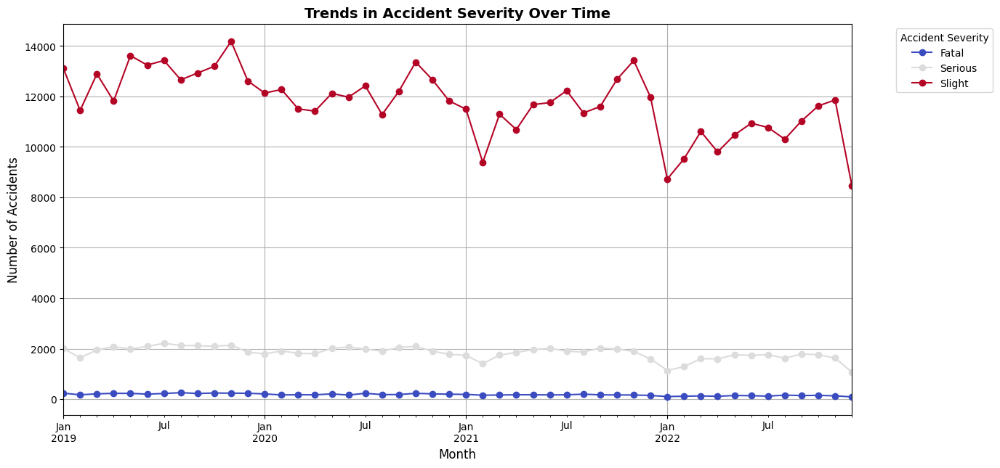

In [81]:
monthly_severity = accident.groupby([accident['Accident Date'].dt.to_period('M'), 'Accident_Severity']).size().unstack(fill_value=0)

plt.figure(figsize=(14, 7))
monthly_severity.plot(kind='line', marker='o', figsize=(14, 7), colormap='coolwarm')

plt.title('Trends in Accident Severity Over Time', fontsize=14, fontweight='bold')
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.legend(title='Accident Severity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

plt.show()

<h1>Area Analysis</h1>

In [82]:
area_year = accident.groupby(['District Area', 'Year']).size().reset_index(name = "Accident_Count")
#area_year 

pivot_table = area_year.pivot(index= 'Year', columns='District Area', values='Accident_Count')
pivot_table

District Area,Aberdeen City,Aberdeenshire,Adur,Allerdale,Alnwick,Amber Valley,Angus,Argyll and Bute,Arun,Ashfield,...,Wokingham,Wolverhampton,Worcester,Worthing,Wrexham,Wychavon,Wycombe,Wyre,Wyre Forest,York
Year,,,,,,,,,,,,,,,,,,,,,
2019,365,552,171,305,107,397,282,268,367,401,...,356,710,215,291,333,366,502,328,230,503
2020,513,691,164,299,105,321,282,288,356,338,...,349,609,210,244,340,389,449,295,230,459
2021,445,687,155,298,20,335,232,280,338,340,...,303,633,239,255,318,323,397,321,273,484
2022,0,0,129,226,0,294,0,0,315,316,...,302,514,194,218,311,283,381,294,236,451


<h3>Creating a line plot</h3>

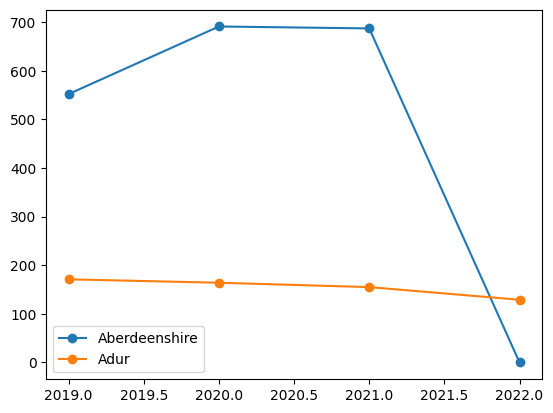

In [83]:
#plt.plot(pivot_table.index,pivot_table['Aberdeenshire'])
#plt.plot(pivot_table.index,pivot_table['Adur'])
#plt.show()

plt.plot(pivot_table.index,pivot_table['Aberdeenshire'], label = 'Aberdeenshire', marker='o')
plt.plot(pivot_table.index,pivot_table['Adur'], label = 'Adur', marker='o')
plt.legend()
plt.show()

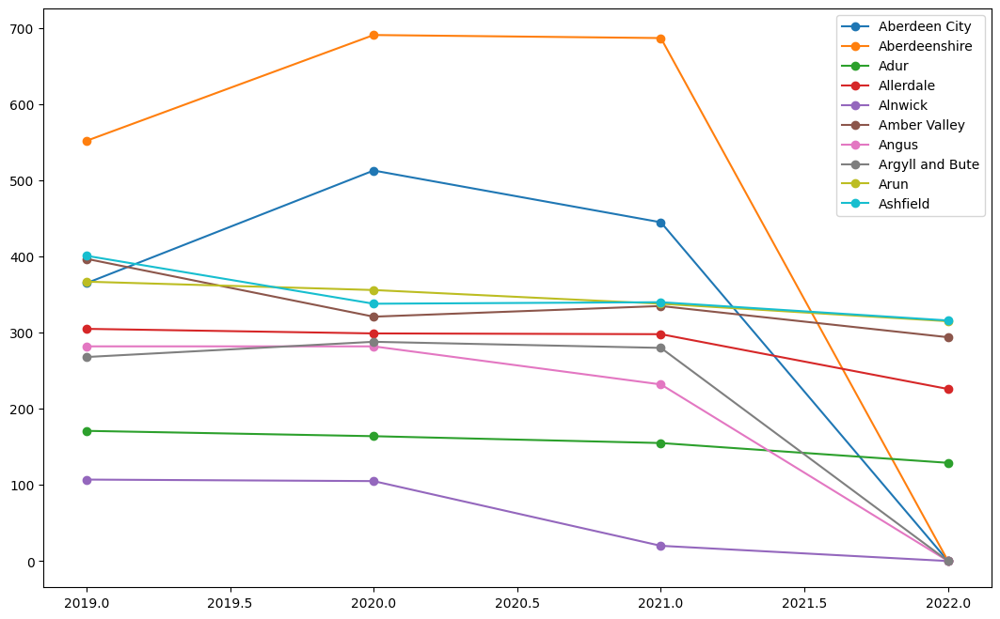

In [84]:
count = 0
for x in pivot_table:
    count += 1
    plt.plot(pivot_table.index,pivot_table[x], label = x, marker='o')
    if count == 10:
        break

plt.gcf().set_size_inches(13,8)
plt.legend()
plt.show()

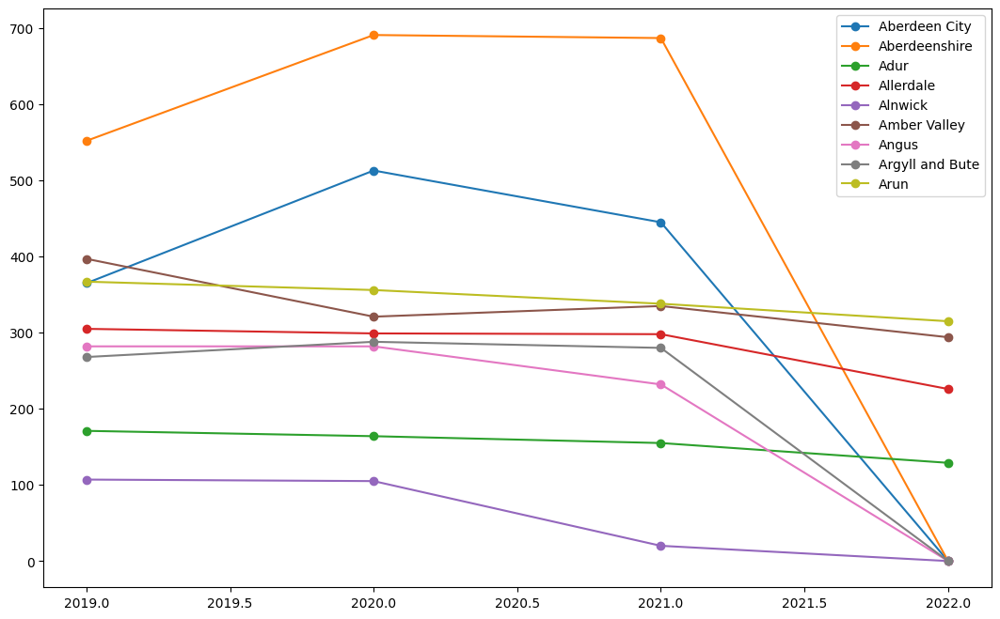

In [85]:
count = 11
for x in pivot_table:
    count += 1
    plt.plot(pivot_table.index,pivot_table[x], label = x, marker='o')
    if count == 20:
        break

plt.gcf().set_size_inches(13,8)
plt.legend()
plt.show()

<h1>Visualizing Correlation</h1>

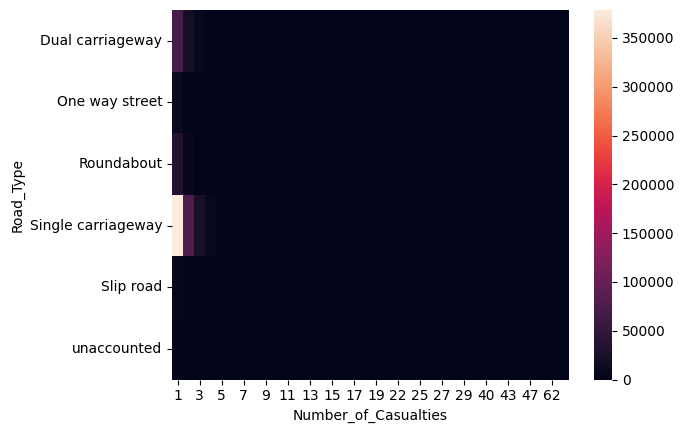

In [86]:
cas_road = accident.groupby(['Road_Type','Number_of_Casualties']).size().unstack()

cas_road

sns.heatmap(cas_road)
plt.show()

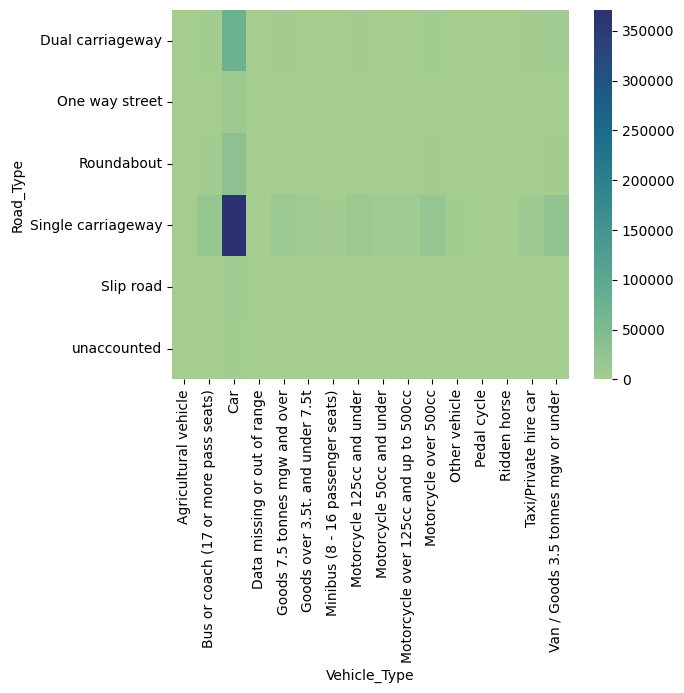

In [76]:
type_vh = accident.groupby(['Road_Type','Vehicle_Type']).size().unstack()

type_vh

sns.heatmap(type_vh, cmap="crest")
plt.show()